>> # PART 1:
> ### PROBLEM STATEMENT

##### Case Study
> ***Exploring Real Estate Prices in the Greater Toronto Area: Web Scrapping Project***

##### Introduction
> The purpose of this study is to analyze the trends and patterns of real estate prices in the GTA region. The study aims to provide insights into the relative affordability of each city within the GTA and infer factors that might influence the price of real estate in one area compared to the other, such as industrial growth, population dynamics, and infrastructures. The study can help stakeholders such as buyers, sellers, and investors make informed decisions based on the current state of the market.

##### Problems
> The case study aims to address the challenges related to understanding real estate price variation in the GTA by leveraging web scraping techniques to collect and analyze data. https://zolo.ca website will be scraped using python built in functions and web scraping packages.

##### Deliverables
> - **Web Scraping Code:** documentation of web scraping code, providing details on the websites from which the data was collected and the scraping process.
> - <strong> Dataset: </strong> clean structured dataset containing scraped information on real estate prices in the GTA; this includes, location, property type, price, total bedrooms/bathrooms, square footage, and date posted.
> - **Visualization:** insights derived from the dataset to highlight trends, patterns, and key statistics in the real estate market within the GTA.
> - **Presentation:** summary of key findings from the web scraping project, including insights into real estate price variations, notable trends, and factors influencing the market.



<div style="text-align: right;">
    <strong> February 3, 2024 </strong>
</div>

>> # PART 2:
> ### DATA COLLECTION  -  WEB SCRAPPING

In [1]:
# LOAD LIBRARIES

# for scraping
import requests
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.action_chains import ActionChains

# for dataset
from collections import OrderedDict
from datetime import datetime
from folium import plugins
import pandas as pd
import numpy as np
import geocoder
import random
import time
import sys
import os
import re

# for visualization
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns
import folium

%matplotlib inline

In [2]:
# OPEN chrome BROWSER

driver = webdriver.Chrome()

In [3]:
# GO TO WEBPAGE

driver.get("https://www.zolo.ca")

In [4]:
# GO TO LOGIN PAGE AND ENTER YOUR "REGISTERED" EMAIL ADDRESS

# define random delay
random_wait_time = random.uniform(1, 3)

# load loggin page
driver.find_element(By.XPATH,'//*[@id="drawer-menu"]/div/nav/div[3]/button[2]').click()

# wait until the email request page pops up
email_pg = WebDriverWait(driver, 5).until(EC.visibility_of_element_located((By.XPATH, '//*[@id="signupModaltop"]/div/div')))

# locate the email bar
email_bar = driver.find_element(By.XPATH,'//*[@id="email"]')
time.sleep(random_wait_time)

# input login email - email address validation
while True:
    email = input("what's your email? ").strip()
    
    if re.search(r'^[\w\.-]+@[\w\.-]+\.\w+$', email, re.IGNORECASE):
        break
    else:
        print("Invalid email")

# send the login email address
email_bar.send_keys(email)
time.sleep(random_wait_time)

# press enter to go to next
email_bar.send_keys(Keys.RETURN)

what's your email?  crested704@yahoo.com


In [5]:
# NEXT PROMPT: ENTER ACCESS CODE #***

# wait for access code request page to load
access_pg = WebDriverWait(driver, 5).until(EC.presence_of_element_located((By.XPATH, '/html/body/main/div/div')))

# locate the code bar
code_bar = driver.find_element(By.XPATH,'//*[@id="pin"]')

# input access code - handling exceptions 
while True:
    access_code = input("What's the 3-digit access code? ")
    if access_code.isdigit() and len(access_code) == 3:
        break
    else:
        print("Invalid input. Please enter a 3-digit integer.")

# send code to the codebar
code_bar.send_keys(access_code)
time.sleep(random_wait_time)

# enter key to login
code_bar.send_keys(Keys.RETURN)
time.sleep(random_wait_time)

What's the 3-digit access code?  000


In [6]:
# DICTIONARY OF LIST FOR ALL GTA REGIONS & MUNICIPALITIES
# REF: https://en.wikipedia.org/wiki/Greater_Toronto_Area

GTA_Divisions = {
    'Durham Region': ['Ajax', 'Clarington', 'Brock, ON', 'Oshawa', 'Pickering', 'Scugog', 'Uxbridge', 'Whitby, ON'],
    'Halton Region': ['Burlington', 'Halton-Hills', 'Milton, ON', 'Oakville'],
    'Peel Region': ['Brampton, ON', 'Caledon, ON', 'Mississauga, ON'],
    'York Region': ['Aurora, ON', 'East-Gwillimbury', 'Georgina, ON', 'King, ON', 'Markham, ON', 'Newmarket,ON',
                    'Richmond-Hill', 'Vaughan, ON', 'Whitchurch-Stouffville', 'Georgina, ON'],
    'Dufferin County': ['Mono', 'Orangeville'],
    'Simcoe County': ['Bradford-West-Gwillimbury', 'New-Tecumseth']
}
df_GTA = pd.DataFrame(list(GTA_Divisions.items()), columns=['Regions', 'Municipalities'])

In [7]:
# FUNCTION THAT RETURNS DICTIONARY OF REGION & MUNICIPALITY

def get_next_city():
    
    '''
    Get the next city in the GTA_Divisions DataFrame.
    
    Returns:
    dict or None: A dictionary containing the current region and municipality.
                  Returns None when all regions and municipalities have been processed.
    '''
    
    # initializing global variables - df_GTA, current_index, current_municipality_index
    global df_GTA
    if 'current_index' not in get_next_city.__dict__:
        get_next_city.current_index = 0
        get_next_city.current_municipality_index = 0

    # check that the function has gone through all the regions
    if get_next_city.current_index >= len(df_GTA):
        print("Finished iterating through all regions.")
        return None
    
    # retrieve region and municipality
    region = df_GTA['Regions'].iloc[get_next_city.current_index]
    municipalities = df_GTA['Municipalities'].iloc[get_next_city.current_index]

    # retrieve current municipality
    municipality = municipalities[get_next_city.current_municipality_index]

    # update indices
    get_next_city.current_municipality_index += 1

    if get_next_city.current_municipality_index >= len(municipalities):
        get_next_city.current_index += 1
        get_next_city.current_municipality_index = 0

    return {region: municipality}

# get_next_city()

In [8]:
def municipal_url_pages():
    '''
    Get the current region and municipality from get_next_city() 
    
    Returns:
    list or []: A list containing the web pages of current region/municipality.
                  Returns empty list when all regions and municipalities have been processed.
    
    '''
    
    # get current municipality
    municipal = get_next_city()
    print(municipal)
    
    # Check for exceptions - if municipal is None
    if municipal is None:
        print("End of GTA list! Reload and try again")
        return []
    
    # get the next municipality    
    region, municipality = municipal.popitem()
    municipality = municipality.replace("'", "")
    
    # Locate the search bar element
    search_bar = driver.find_element(By.XPATH, '//*[@id="sarea"]')
    
    # Clear the content of the search bar
    search_bar.clear()
    time.sleep(random_wait_time)
    
    # type the new municipality into the search bar
    search_bar.send_keys(municipality)
    time.sleep(random_wait_time)
    
    # Wait for suggested inputs to populate
    driver.implicitly_wait(5)
    
    # Use the arrow keys to navigate to the first suggestion
    ActionChains(driver).send_keys(Keys.ARROW_DOWN).perform()
    time.sleep(random_wait_time)
    
    # Press Enter to select the highlighted municipality suggestion
    ActionChains(driver).send_keys(Keys.RETURN).perform()
    time.sleep(5)
    
    # extract the html/xml/... from the current opened webpage
    page_source = driver.page_source
    
    # load page source into bs4 using html parser
    soup = BeautifulSoup(page_source, 'html.parser')
    
    # Extract website links of available pages
    soup_1 = soup.find('nav', class_='xs-hide md-flex xs-mb5')
    soup_2 = soup_1.find_all('a', class_ = 'button')
    
    # put all the websites of current municipality into a unique list of elements
    page_links = []
    for tag in soup_2:
        page_link = tag.get('href')
        page_links.append(page_link)
    
    
    # remove duplicated url - list(set(page_links))
    page_links = OrderedDict.fromkeys(page_links)
    
    # Convert the keys of the OrderedDict to a list
    page_links = list(page_links.keys())
    

    # Extract base_url
    base_url = page_links[0].rsplit('/page-', 1)[0]

    # Extract existing_pages
    existing_pages = [int(page_link.rsplit('/page-', 1)[1]) for page_link in page_links if '/page-' in page_link]

    all_pages = set(range(1, max(existing_pages)+1)) # Assuming the range is from page-1 to page-11
    missing_pages = list(all_pages - set(existing_pages))

    page_links = [f'{base_url}/page-{page}' for page in all_pages]
    
    
    
    print(f'Number of pages containing listings: {len(page_links)}')
    return page_links

# municipal_url_pages()

In [9]:

def goto_page_links():
    '''
    Get all page links of current municipality from: get_next_city() 
    
    Returns:
    DataFrame : A df containing the web pages of all the house listing in current region/municipality.
                Returns empty list when all regions and municipalities have been processed.
    
    '''
    # get page links of the current municipality
    page_links = municipal_url_pages()
    
    # create an empty DataFrame
    df = pd.DataFrame(columns=['HouseWeb'])
    
    # define random delay
    wait_time = random.uniform(6, 10)
    
    for page_link in page_links:
        
        # go to the URL page
        driver.get(page_link)
        time.sleep(wait_time)
        
        # extract the HTML from the current opened webpage
        page_source = driver.page_source

        # load page source into BeautifulSoup using html.parser
        soup = BeautifulSoup(page_source, 'html.parser')

        # get all the listings URL in the current page
        houses = soup.find_all('div', class_='card-listing--location')
        
        # Handling exceptions:
        if houses:
            list_houses = [house.a['href'].strip() for house in houses if house.a and 'href' in house.a.attrs]
            
            if list_houses:
                # Add the new list to the DataFrame
                df = pd.concat([df, pd.DataFrame(list_houses, columns=['HouseWeb'])], ignore_index=True)
                
                
    print(f'Number of listings available for current municipality is: {len(df)}')            
    return df
# goto_page_links()

In [10]:
def goto_listing_links():
    
    '''
    Inputs:
            Get a DataFrame of listings in current municipality from: goto_page_links()
    Parameters:
            df (pd.DataFrame): Existing DataFrame to be updated.
    Returns:
            DataFrame : An updated df containing all the information required for analysis
    '''
    
    # get the dataframe of current municipality
    house_df = goto_page_links()
    
    # set random delay
    wait_time = random.uniform(1, 2)
    
    # Create new columns for the results
    house_df['Address'] = None
    house_df['Price'] = None
    house_df['PropertyType'] = None
    house_df['Bedroom'] = None
    house_df['BedroomPlus'] = None
    house_df['Bathroom'] = None
    house_df['SquareFootage'] = None
    house_df['Style'] = None
    house_df['Age'] = None
    house_df['Community'] = None
    house_df['DatePosted'] = None
    
    # iterate through the DataFrame and obtain relevant information
    for index, row in house_df.iterrows():
        house_link = row['HouseWeb']
        
        # set variables
        max_attempts = 3
        attempt_count = 0
        successful_attempt = False
        API_Key = os.environ.get('scrapeOps_API_key')
        
        
        # send request to website up to 'max attempt'
        while attempt_count < max_attempts:
            try:
                # access the website using API key
                '''
                to store API key in environment variable using jupyter notebook, type:
                    %env scrapeOps_API_key = my_secrete_key
                to retrieve the API key, type:
                    api_key = os.environ.get('scrapeOps_API_key')
                '''
                response = requests.get(
                    url='https://proxy.scrapeops.io/v1/',
                    params={
                        'api_key': API_Key,
                        'url': house_link,},)
                time.sleep(1)
                
                # handling Non-OK Status Codes:
                if response.status_code != 200:
                    print(f"Error: Unable to access the website: {house_link} Status Code: {response.status_code}")
                else:
                    successful_attempt = True
                    break
            except RequestException as e:
                print(f"Error during attempt {attempt_count + 1}: {e}")
                
            # Wait for some time before the next attempt    
            time.sleep(wait_time)
            attempt_count += 1
            
        if not successful_attempt:
            # Skip the remaining code if attempts fail and close the web browser at the end of code
            continue
            
            
            
            
        # load page source into BeautifulSoup using html.parser
        soup = BeautifulSoup(response.content, "html.parser")
        

        ## get listing address
        raw_address = soup.find('section', class_='listing-location')
        try:
            # extract and clean address
            address = raw_address.get_text(strip=True).split(',')
            address = ' '.join(address)
            # apply RE to format address
            address = re.sub(r'([a-z])([A-Z])', r'\1, \2', address)
            address = re.sub(r'(\s\w+)$', r',\1', address)
        except:
            address = None
        
        
        ## get property price
        raw_price = soup.find('div', class_='xs-mr1')
        if raw_price:
            try:
                # Extract the text, remove commas and dollar signs, and convert to an integer
                price = int(raw_price.get_text(strip=True).replace(',', '').replace('$', ''))
            except ValueError:
                price = None
        else:
            price = None
        
        
        ## get posted date
        try:
            # extract and format the posted date
            date_posted = soup.find('div', class_='xs-mt3 sm-mt0').span.get_text().split('(')[0].strip()
            date_posted = datetime.strptime(date_posted, '%b %d, %Y').strftime('%Y-%m-%d')
        except (ValueError, AttributeError):
            date_posted = None
        
        
                
        ## get other information
        raw_info = soup.find_all('div', class_='column')
        property_info = {}

        for info in raw_info:
            try:
                label = info.find('div', class_='column-label').text.strip()
                value = info.find('div', class_='column-value').text.strip()
                property_info[label] = value
            except AttributeError:
                pass

        # Access the required values of other information
        bedrooms = property_info.get('Bedrooms', '')
        bedrooms_plus = property_info.get('Bedrooms Plus', '')
        bathrooms = property_info.get('Bathrooms', '')
        style = property_info.get('Style', '')
        ppty_type = property_info.get('Type', '')
        square_footage = property_info.get('Size (sq ft)', '')
        age = property_info.get('Age', '')


        # Update the corresponding columns with the results
        house_df.at[index, 'Address'] = address
        house_df.at[index, 'Price'] = price
        house_df.at[index, 'DatePosted'] = date_posted
        house_df.at[index, 'Bedroom'] = bedrooms
        house_df.at[index, 'BedroomPlus'] = bedrooms_plus
        house_df.at[index, 'Bathroom'] = bathrooms
        house_df.at[index, 'Style'] = style        
        house_df.at[index, 'PropertyType'] = ppty_type
        house_df.at[index, 'SquareFootage'] = square_footage
        house_df.at[index, 'Age'] = age
    
    return house_df
# goto_listing_links()

In [ ]:
def main():
    
    '''
    Web Scraping Script for GTA (Greater Toronto Area) Municipal Data

        This script performs web scraping to gather data on municipal divisions in the Greater Toronto Area (GTA).
    It iterates over municipal entries, pauses at specified intervals for user confirmation, retrieves data from
    listing links, and saves the data to a CSV file. The purpose is to collect information about different municipal
    divisions in the GTA for analysis or further processing.

    Other Key Functions Dependencies:
    - get_next_city()
    - municipal_url_pages()
    - goto_page_links()
    - goto_listing_links()

    Author: Mayokun Ajiboye
    Date: February 2024
    
    '''
    
    pause_exe = random.uniform(5, 7)
    iteration = sum(len(value) for value in GTA_Divisions.values())
    GTA = range(iteration)

    for municipal in GTA:

        # pause execution until manually started
        if (municipal % 1 == 0) and (municipal > 0):
            while True:
                user_input = input("do you want to continue? (y/n): ").lower()
                if user_input == "y":
                    break
                elif user_input == "n":
                    confirm_exit = input("are you sure you want to exit? (y/n): ").lower()
                    if confirm_exit == "y":
                        print('exiting the program. Goodbye!')
                        sys.exit()
                    elif confirm_exit == "n":
                        break
                else:
                    print("invalid input. Please enter 'y' or 'n'.")


        # get info and populate table
        data = goto_listing_links()
        time.sleep(pause_exe)

        #*** save data to 'csv' - appending mode ***#
        data.to_csv('scrapped_data.csv', mode='a', header=(municipal==0), index=False)
        print(f'{municipal+1} municipals have been saved')

        if municipal == (iteration - 1):
            print('End of Web Scraping!')
            
if __name__ == "__main__":
    main()

>> # PART 3:
> ### DATA CLEANING

In [11]:
# STEP 1: IMPORT AND CLEAN - 3R's READ, REMOVE, AND RESET

# read data from CSV file into a DataFrame
houses_df = pd.read_csv('scrapped_data.csv')

# remove duplicate rows based on all columns
houses_df = houses_df.drop_duplicates()

# reset the index to ensure a clean and continuous integer index
houses_df = houses_df.reset_index(drop=True)

# Check if any column has all values as None (NaN)
columns_to_delete = houses_df.columns[houses_df.isnull().all()]

# Delete the identified columns
houses_df = houses_df.drop(columns=columns_to_delete)

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df.head(2)

Number of rows: 6550, Number of columns: 11


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,Age,DatePosted
0,https://www.zolo.ca/ajax-real-estate/57-welsh-...,"57 Welsh Street, Ajax Central, West",1299000.0,Detached,4.0,1.0,4.0,NaN,2-Storey,NaN,2024-02-01
1,https://www.zolo.ca/ajax-real-estate/95-hills-...,"95 Hills Road, Ajax South, East",1099999.0,Detached,3.0,1.0,3.0,NaN,Bungalow,NaN,2024-02-01


In [12]:
# STEP 2a: FORMAT DATETIME AND REMOVE ROWS WITH INVALID DATETIME

# format date
houses_df['DatePosted'] = pd.to_datetime(houses_df['DatePosted'], format="%Y-%m-%d", errors='coerce')

# number of rows with invalid dates
invalid_date_rows = houses_df[houses_df['DatePosted'].isna()]
print(f"Number of rows removed due to invalid dates: {len(invalid_date_rows)}")

# remove all rows with invalid dates
houses_df1 = houses_df.dropna(subset=['DatePosted'])

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df1.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df1.head(2)

Number of rows removed due to invalid dates: 56
Number of rows: 6494, Number of columns: 11


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,Age,DatePosted
0,https://www.zolo.ca/ajax-real-estate/57-welsh-...,"57 Welsh Street, Ajax Central, West",1299000.0,Detached,4.0,1.0,4.0,NaN,2-Storey,NaN,2024-02-01
1,https://www.zolo.ca/ajax-real-estate/95-hills-...,"95 Hills Road, Ajax South, East",1099999.0,Detached,3.0,1.0,3.0,NaN,Bungalow,NaN,2024-02-01


In [13]:
# STEP 2b: FORMAT THE AGE OF THE BUILDING - INTEGER


def format_age(age):
    
    '''
    Process the 'Age' values in the DataFrame.
    
    Parameters:
    - age (str): The age value to be processed.

    Returns:
    - int: Processed age value. If 'None' or missing or string, returns 0.
      If in range (e.g., '3-5'), returns the highest number in the range.
      If a single value, returns the value as an integer.
    '''
    
    try:
        if pd.isna(age) or age.lower() == 'none':
            return 0  
        elif '-' in age:
            return max(map(int, age.split('-')))
        else:
            return int(age)
    except:
        return 0

    
# apply the custom function to the 'Age' column and rename as building_age
houses_df1['BuildingAge'] = houses_df1['Age'].apply(format_age)

# Drop the original 'age' column
houses_df1 = houses_df1.drop('Age', axis=1)

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df1.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df1.tail(2)

Number of rows: 6494, Number of columns: 11


C:\Users\myk70\AppData\Local\Temp\ipykernel_15976\1403456025.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  houses_df1['BuildingAge'] = houses_df1['Age'].apply(format_age)


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge
6548,https://www.zolo.ca/new-tecumseth-real-estate/...,"204 - 2 Briar Hill Heights, New Tecumseth, All...",499000.0,Condo Apt,1.0,1.0,1.0,900-999,Apartment,2023-05-09,15
6549,https://www.zolo.ca/new-tecumseth-real-estate/...,"8078 Highway 9 N/a, New Tecumseth, Tottenham",6359990.0,Detached,5.0,NaN,4.0,5000+,Bungalow-Raised,2023-03-07,0


In [14]:
# STEP 3a: ADD COLUMN FOR CITY/GTA DIVISION

# define regular expression pattern to extract the cities/divisions from the website link
city_pattern = r'https://www.zolo.ca/([^/]+)-real-estate/'

# Extract the region using the pattern and create a new 'region' column
houses_df1['City'] = houses_df1['HouseWeb'].str.extract(city_pattern)

# remove all rows with invalid city
houses_df2 = houses_df1.dropna(subset=['City'])

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df2.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df2.head(2)

Number of rows: 6494, Number of columns: 12


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge,City
0,https://www.zolo.ca/ajax-real-estate/57-welsh-...,"57 Welsh Street, Ajax Central, West",1299000.0,Detached,4.0,1.0,4.0,NaN,2-Storey,2024-02-01,0,ajax
1,https://www.zolo.ca/ajax-real-estate/95-hills-...,"95 Hills Road, Ajax South, East",1099999.0,Detached,3.0,1.0,3.0,NaN,Bungalow,2024-02-01,0,ajax


In [15]:
# STEP 3b: ADD COLUMN FOR REGION

def map_city_to_region(city):
    '''
    Given a city, this function maps it to a region based on a dictionary of regions (keys) and lists of cities (values).
    
    Parameters:
    - city (str): The city to be mapped to a region.
    
    Returns:
    - str: The region to which the input city belongs. If the city is not found in any region, 'Unknown' is returned.
    '''
    
    # Convert all keys and values of GTA_Divisions to lowercase
    GTA_Divisions_lower = {key.lower(): [city.lower() for city in cities] for key, cities in GTA_Divisions.items()}

    
    for region, cities in GTA_Divisions_lower.items():
        if city in cities:
            return region
    return 'Unknown'

# Create a new 'region' column based on the mapping
houses_df2['Region'] = houses_df2['City'].apply(map_city_to_region)

# remove all rows with invalid city
houses_df3 = houses_df2.dropna(subset=['Region'])

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df3.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df3.tail(2)

Number of rows: 6494, Number of columns: 13


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge,City,Region
6548,https://www.zolo.ca/new-tecumseth-real-estate/...,"204 - 2 Briar Hill Heights, New Tecumseth, All...",499000.0,Condo Apt,1.0,1.0,1.0,900-999,Apartment,2023-05-09,15,new-tecumseth,simcoe county
6549,https://www.zolo.ca/new-tecumseth-real-estate/...,"8078 Highway 9 N/a, New Tecumseth, Tottenham",6359990.0,Detached,5.0,NaN,4.0,5000+,Bungalow-Raised,2023-03-07,0,new-tecumseth,simcoe county


In [16]:
# STEP 3c: ADD COLUMN FOR HOUSE_ADDRESS

# Define a regular expression pattern to extract the desired part
address_pattern = r'-real-estate/([^.]+)'

# Extract the house address from HouseWeb 'address_pattern'
houses_df3['HouseAddress'] = houses_df3['HouseWeb'].str.extract(address_pattern, expand=False)

# Concatenate with the 'city' column
houses_df3['HouseAddress'] = houses_df3['HouseAddress'] + ', ' + houses_df3['City']
houses_df3['HouseAddress'] = houses_df3['HouseAddress'].str.replace('-', ' ')

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df3.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df3.head(2)

Number of rows: 6494, Number of columns: 14


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge,City,Region,HouseAddress
0,https://www.zolo.ca/ajax-real-estate/57-welsh-...,"57 Welsh Street, Ajax Central, West",1299000.0,Detached,4.0,1.0,4.0,NaN,2-Storey,2024-02-01,0,ajax,durham region,"57 welsh street, ajax"
1,https://www.zolo.ca/ajax-real-estate/95-hills-...,"95 Hills Road, Ajax South, East",1099999.0,Detached,3.0,1.0,3.0,NaN,Bungalow,2024-02-01,0,ajax,durham region,"95 hills road, ajax"


In [ ]:
# STEP 3c: ADD COLUMN FOR LATITUDE AND LONGITUDE

def get_latlng(address):
    
    '''
        This function takes a physical address as input and uses 'geocoder'
    to retrieve the corresponding latitude and longitude coordinates.
    
    Parameters:
    - address (str): The physical address for which to obtain latitude and longitude.

    Returns:
    - tuple: A tuple containing two float values representing the latitude and
      longitude of the provided address.
    '''
    
    try:
        location = geocoder.arcgis(address)
        if location.ok:
            latitude, longitude = location.latlng
            return latitude, longitude
        else:
            print(f"Failed to retrieve coordinates for '{address}': {location.status}")
            return None, None

    except Exception as e:
        print(f"An error occurred: {e}")
        return None, None


# update the df with new column: lat_long computed from get_latlng()
houses_df3['Lat_Long'] = houses_df3['HouseAddress'].apply(lambda x: get_latlng(x))

# remove all rows with invalid lat_long
houses_df4 = houses_df3.dropna(subset=['Lat_Long'])

# Save the DataFrame to a CSV file
houses_df4.to_csv('clean_csv.csv', index=False)

# Display the number of rows and columns in the DataFrame
rows, columns = houses_df4.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
houses_df4.tail()

>> # PART 4:
> ### DATA ANALYSIS

In [17]:
# IMPORT CLEANED DATA FOR ANALYSIS

clean_df = pd.read_csv('clean_csv.csv')

# Display the number of rows and columns in the DataFrame
rows, columns = clean_df.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
clean_df.head(1)

Number of rows: 6491, Number of columns: 15


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge,City,Region,HouseAddress,Lat_Long
0,https://www.zolo.ca/ajax-real-estate/57-welsh-...,"57 Welsh Street, Ajax Central, West",1299000.0,Detached,4.0,1.0,4.0,NaN,2-Storey,2024-02-01,0,ajax,durham region,"57 welsh street, ajax","(43.866893990834654, -79.06431696334124)"


In [18]:
# CLEAN DATA FOR STATISTICAL ANALYSIS

# remove rows where 'price' is blank or <= 100,000
clean_df1 = clean_df[clean_df['Price'].notna() & (clean_df['Price'] > 100000)]

# reset index after dropping rows
clean_df1.reset_index(drop=True, inplace=True)

# Display the number of rows and columns in the DataFrame
rows, columns = clean_df1.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
clean_df1.tail(1)

Number of rows: 6091, Number of columns: 15


,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge,City,Region,HouseAddress,Lat_Long
6090,https://www.zolo.ca/new-tecumseth-real-estate/...,"8078 Highway 9 N/a, New Tecumseth, Tottenham",6359990.0,Detached,5.0,NaN,4.0,5000+,Bungalow-Raised,2023-03-07,0,new-tecumseth,simcoe county,"8078 highway 9, new tecumseth","(43.99136449861871, -79.77455425997012)"


In [19]:
# CLEAN DATA FOR MAP VISUALIZATION

# Convert the object DATA TYPE OF LAT_LONG to strings and remove parentheses
clean_df1['Lat_Long'] = clean_df1['Lat_Long'].astype(str).str.strip('()')

# Split the values into two columns
clean_df1[['Latt', 'Longt']] = clean_df1['Lat_Long'].str.split(',', expand=True)

# # Convert the new columns to floating-point values
clean_df1['Latt'] = pd.to_numeric(clean_df1['Latt'], errors='coerce')
clean_df1['Longt'] = pd.to_numeric(clean_df1['Longt'], errors='coerce')

# Drop the original laat_long
clean_df1 = clean_df1.drop(columns=['Lat_Long'])

# Display the number of rows and columns in the DataFrame
rows, columns = clean_df1.shape
print(f"Number of rows: {rows}, Number of columns: {columns}")

# show some sample data
clean_df1.tail(2)

Number of rows: 6091, Number of columns: 16


C:\Users\myk70\AppData\Local\Temp\ipykernel_15976\1083557207.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_df1['Lat_Long'] = clean_df1['Lat_Long'].astype(str).str.strip('()')
C:\Users\myk70\AppData\Local\Temp\ipykernel_15976\1083557207.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_df1[['Latt', 'Longt']] = clean_df1['Lat_Long'].str.split(',', expand=True)
C:\Users\myk70\AppData\Local\Temp\ipykernel_15976\1083557207.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy o

,HouseWeb,Address,Price,PropertyType,Bedroom,BedroomPlus,Bathroom,SquareFootage,Style,DatePosted,BuildingAge,City,Region,HouseAddress,Latt,Longt
6089,https://www.zolo.ca/new-tecumseth-real-estate/...,"204 - 2 Briar Hill Heights, New Tecumseth, All...",499000.0,Condo Apt,1.0,1.0,1.0,900-999,Apartment,2023-05-09,15,new-tecumseth,simcoe county,"2 briar hill heights/204, new tecumseth",44.158127,-79.807910
6090,https://www.zolo.ca/new-tecumseth-real-estate/...,"8078 Highway 9 N/a, New Tecumseth, Tottenham",6359990.0,Detached,5.0,NaN,4.0,5000+,Bungalow-Raised,2023-03-07,0,new-tecumseth,simcoe county,"8078 highway 9, new tecumseth",43.991364,-79.774554


In [20]:
clean_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6091 entries, 0 to 6090
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   HouseWeb       6091 non-null   object 
 1   Address        6091 non-null   object 
 2   Price          6091 non-null   float64
 3   PropertyType   5897 non-null   object 
 4   Bedroom        5877 non-null   float64
 5   BedroomPlus    2596 non-null   float64
 6   Bathroom       5976 non-null   float64
 7   SquareFootage  4099 non-null   object 
 8   Style          5812 non-null   object 
 9   DatePosted     6091 non-null   object 
 10  BuildingAge    6091 non-null   int64  
 11  City           6091 non-null   object 
 12  Region         6091 non-null   object 
 13  HouseAddress   6091 non-null   object 
 14  Latt           6091 non-null   float64
 15  Longt          6091 non-null   float64
dtypes: float64(6), int64(1), object(9)
memory usage: 761.5+ KB


In [21]:
# PRICE STATISTICS BY REGION & CITIES - MEAN HOUSE PRICES

#regional_statistic = clean_df1.groupby('Region')['Price'].agg(['mean', 'median', 'min', 'max'])
regional_statistic = clean_df1.pivot_table(values='Price', index=['Region', 'City'], aggfunc=['mean', 'median', 'min', 'max'])
regional_statistic

mean     median        min  \
                                                  Price      Price      Price   
Region          City                                                            
dufferin county mono                       2.753240e+06  1999000.0   599000.0   
                orangeville                9.317349e+05   837000.0   389000.0   
durham region   ajax                       1.069540e+06   958985.0   499900.0   
                brock                      1.505098e+06   970000.0   269900.0   
                clarington                 1.085431e+06   799450.0   349900.0   
                oshawa                     9.442816e+05   799000.0   269990.0   
                pickering                  1.610321e+06   999000.0   425000.0   
                scugog                     1.396871e+06  1199000.0   525000.0   
                uxbridge                   1.819351e+06  1499900.0   299000.0   
                whitby                     1.160915e+06  1079000.0   449000.0   
halton region   burlington                 1.464056e+06  1047400.0   309000.0   
                halton-hills               1.867740e+06  1289000.0   279913.0   
                milton                     1.612771e+06  1149350.0   499900.0   
                oakville                   2.102684e+06  1399000.0   420000.0   
peel region     brampton                   1.156143e+06  1049000.0   395000.0   
                caledon                    2.520173e+06  1599000.0   695000.0   
                mississauga                1.324378e+06   859000.0   375000.0   
simcoe county   bradford                   1.589633e+06  1599900.0   869999.0   
                bradford-west-gwillimbury  1.608121e+06  1374900.0   299900.0   
                new-tecumseth              1.317297e+06   955000.0   485000.0   
york region     aurora                     1.984235e+06  1380000.0   490000.0   
                east-gwillimbury           1.856370e+06  1524450.0   500000.0   
                georgina                   1.306291e+06   989900.0   189900.0   
                georgina-islands           4.936665e+05   508999.5   148000.0   
                king                       3.398267e+06  2442500.0   519900.0   
                king-city                  3.749500e+06  3749500.0  2999000.0   
                markham                    1.693188e+06  1258000.0   419000.0   
                newmarket                  1.296490e+06  1100000.0   525000.0   
                richmond-hill              1.938575e+06  1480000.0   439900.0   
                vaughan                    1.768864e+06  1129900.0   399999.0   
                whitchurch-stouffville     2.967987e+06  1599000.0   499000.0   

                                                  max  
                                                Price  
Region          City                                   
dufferin county mono                       24500000.0  
                orangeville                 2399000.0  
durham region   ajax                        3275000.0  
                brock                       8850000.0  
                clarington                  7500000.0  
                oshawa                     12880000.0  
                pickering                  60000000.0  
                scugog                      3990000.0  
                uxbridge                    9025000.0  
                whitby                      3650000.0  
halton region   burlington                 14999000.0  
                halton-hills               18500000.0  
                milton                     12900000.0  
                oakville                   16000000.0  
peel region     brampton                    9600000.0  
                caledon                    25000000.0  
                mississauga                29900000.0  
simcoe county   bradford                    2299000.0  
                bradford-west-gwillimbury   6200000.0  
                new-tecumseth               6800000.0  
york reg

>> # PART 5:
> ### DATA VISUALIZATION

Text(0, 0.5, 'Propert Type')

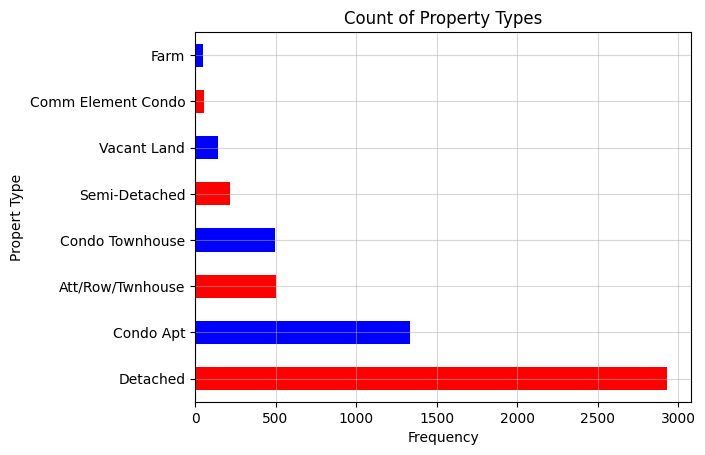

In [22]:
# MAJOR PROPERTY TYPES CONTAINED IN DATA
# COUNT GREATER THAN 20

# Filter the DataFrame based on counts, excluding property types with count <20
filtered_df = clean_df1[clean_df1['PropertyType'].\
                        isin(clean_df1['PropertyType'].value_counts()\
                             [clean_df1['PropertyType'].value_counts() >= 20].index)]

# Plot the horizontal bar chart
filtered_df['PropertyType'].value_counts().plot(kind='barh', title='Count of Property Types',\
                                                color = ['red', 'blue'])
plt.grid(alpha=0.5)
plt.xlabel('Frequency', fontsize=10)
plt.ylabel('Propert Type', fontsize=10)

In [23]:
clean_df1['PropertyType'].value_counts()

PropertyType
Detached              2934
Condo Apt             1335
Att/Row/Twnhouse       501
Condo Townhouse        495
Semi-Detached          220
Vacant Land            145
Comm Element Condo      57
Farm                    47
Land                    19
Rural Resid             18
Link                    17
Investment              14
Duplex                  14
Det Condo               12
Leasehold Condo         11
Triplex                 10
Cottage                  7
Semi-Det Condo           6
Other                    6
Commercial/Retail        5
Mobile/Trailer           4
Fourplex                 3
Co-Op Apt                3
Industrial               3
Store W/Apt/Office       3
Office                   3
Multiplex                2
Sale Of Business         2
Co-Ownership Apt         1
Name: count, dtype: int64

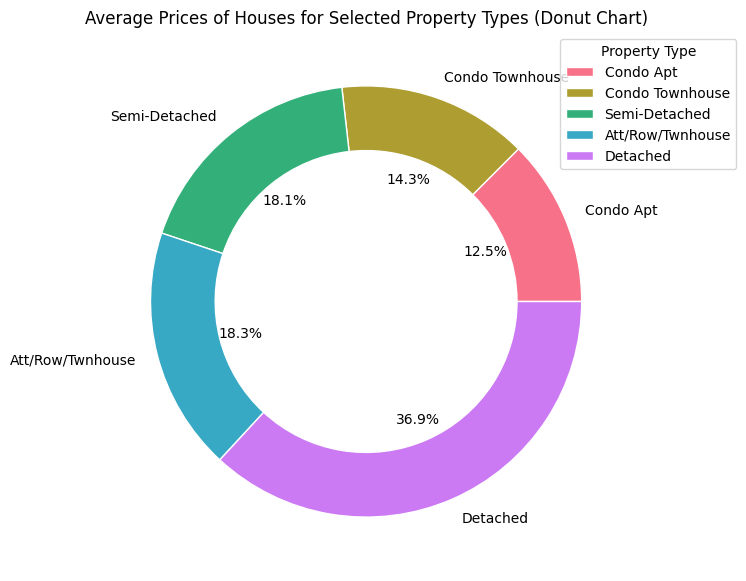

In [24]:
# AVERAGE PRICES OF HOUSES FOR SELECTED PROPERTY TYPES

# Select the property types to compare
selected_property_types = ['Detached', 'Condo Townhouse', 'Att/Row/Twnhouse', 'Semi-Detached', 'Condo Apt']

# Filter the DataFrame for the selected property types
selected_df = clean_df1[clean_df1['PropertyType'].isin(selected_property_types)]

# Calculate the average price for each property type
average_prices = selected_df.groupby('PropertyType')['Price'].mean().sort_values().reset_index()

# Set the style and color palette
palette = sns.color_palette("husl", n_colors=len(average_prices['PropertyType'].unique()))

# Plot a donut chart to compare average prices for selected property types
plt.figure(figsize=(7, 7))
wedges, texts, autotexts = plt.pie(average_prices['Price'], labels=average_prices['PropertyType'], autopct='%1.1f%%', colors=palette,
                                   wedgeprops=dict(width=0.3, edgecolor='w'))  # Adjust the width for the donut effect

# Add legend at the upper right corner
plt.legend(wedges, average_prices['PropertyType'], title='Property Type', loc='upper right', bbox_to_anchor=(1.2, 1))

plt.title('Average Prices of Houses for Selected Property Types (Donut Chart)')
plt.show()

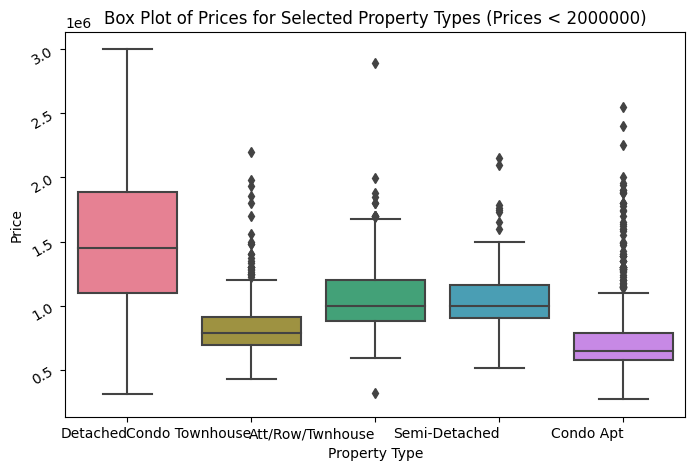

In [25]:
# BOX PLOT OF PRICES FOR SELECTED PROPERTY TYPES (PRICES < 3000000)

# Select the property types to compare
selected_property_types = ['Detached', 'Condo Townhouse', 'Att/Row/Twnhouse', 'Semi-Detached', 'Condo Apt']

# Filter the DataFrame for the selected property types and prices less than 2000000
selected_df = clean_df1[(clean_df1['PropertyType'].isin(selected_property_types)) & (clean_df1['Price'] < 3000000)]

# Create a box plot
plt.figure(figsize=(8, 5))
sns.boxplot(x='PropertyType', y='Price', data=selected_df, palette='husl')
plt.title('Box Plot of Prices for Selected Property Types (Prices < 2000000)')
plt.xlabel('Property Type')
plt.ylabel('Price')
plt.xticks(rotation=0, ha='right')
plt.yticks(rotation=30, ha='right')
plt.show()

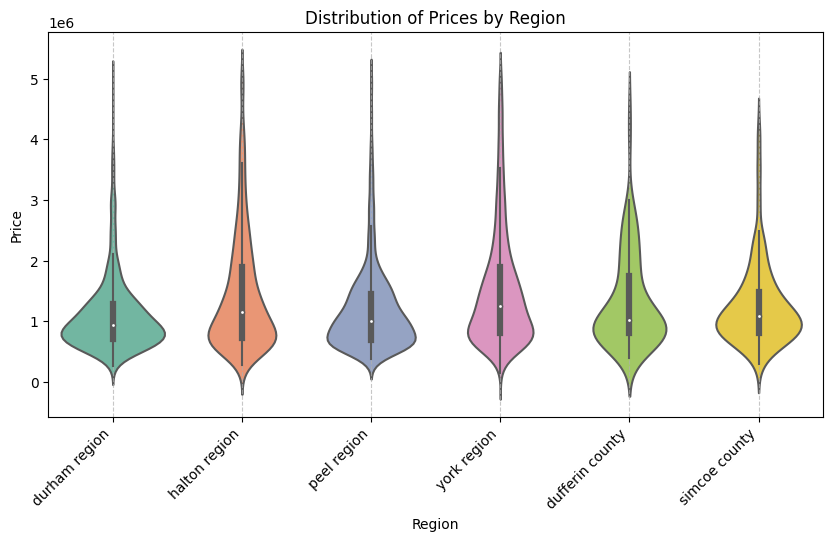

In [26]:
# DISTRIBUTION OF PRICES BY REGION

# select data columns
violin_data = clean_df1[['Region', 'Price']]
violin_data = clean_df1[clean_df1['Price'] < 5000000]

# Create a violin plot
plt.figure(figsize=(10, 5))
sns.violinplot(x='Region', y='Price', data=violin_data, palette='Set2')
plt.title('Distribution of Prices by Region')
plt.xlabel('Region')
plt.ylabel('Price')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.show()

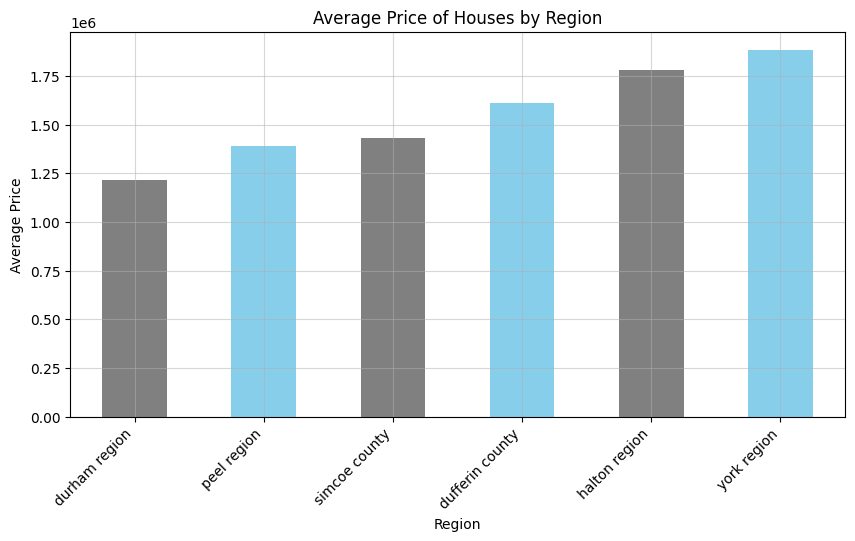

In [27]:
# AVERAGE PRICE OF HOUSES BY REGION

# select columns for bar char
bar_data = clean_df1[['Region', 'Price']]

# Calculate the average price for each region
average_prices = bar_data.groupby('Region')['Price'].mean().sort_values()

# Plot the bar chart
plt.figure(figsize=(10, 5))
average_prices.plot(kind='bar', color=['gray', 'skyblue'])
plt.title('Average Price of Houses by Region')
plt.xlabel('Region')
plt.ylabel('Average Price')
plt.grid(alpha=0.5)
plt.xticks(rotation=45, ha='right')
plt.show()

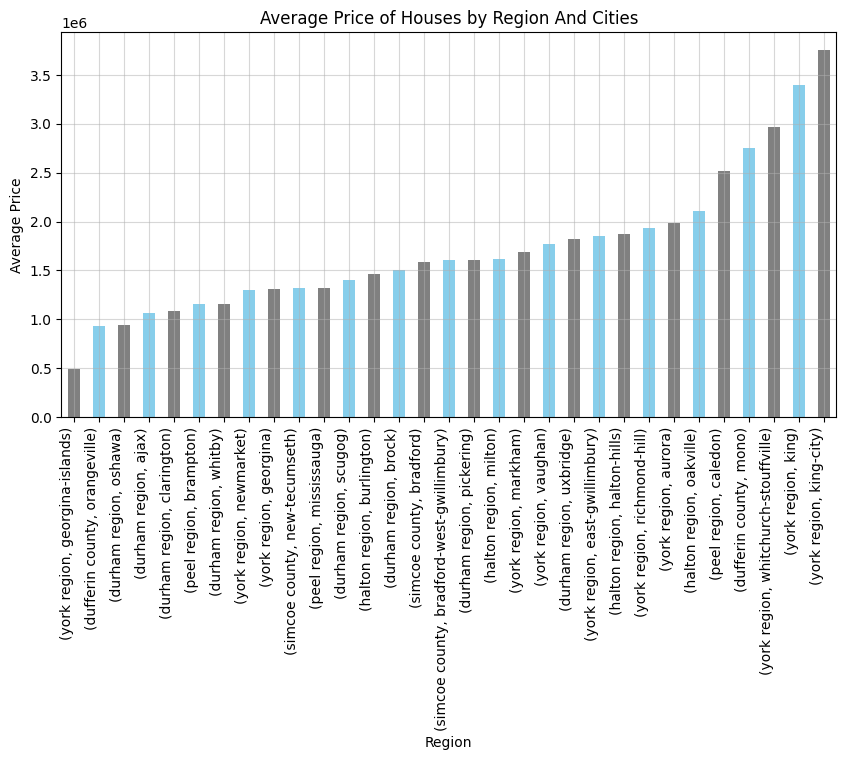

In [28]:
# AVERAGE PRICE OF HOUSES BY REGION AND CITIES

# select columns for bar char
bar_data1 = clean_df1[['Region', 'City', 'Price']]

# Calculate the average price for each region
average_prices = bar_data1.groupby(['Region', 'City'])['Price'].mean().sort_values()

# Plot the bar chart
plt.figure(figsize=(10, 5))
average_prices.plot(kind='bar', color=['gray', 'skyblue'])
plt.title('Average Price of Houses by Region And Cities')
plt.xlabel('Region')
plt.ylabel('Average Price')
plt.grid(alpha=0.5)
plt.xticks(rotation=90, ha='right')
plt.show()

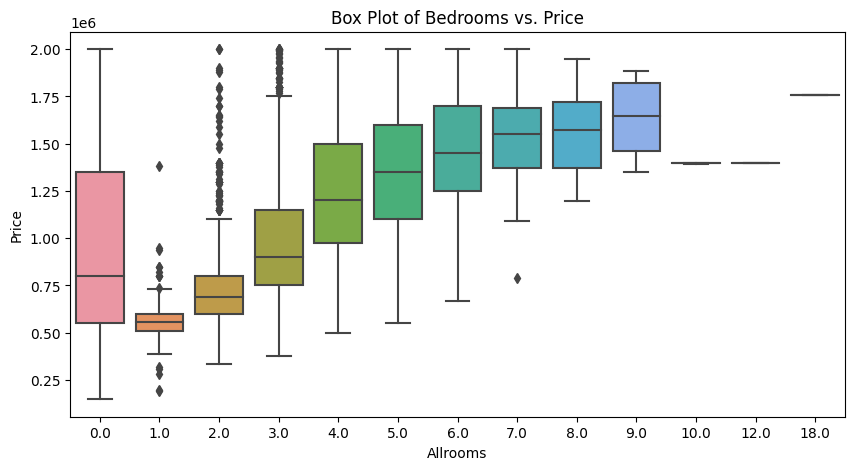

In [29]:
# BOX PLOT OF BEDROOMS VS. PRICE

# replace blanks in 'Room' and 'RoomPlus' with zeros
clean_df1['BedroomPlus'] = clean_df1['BedroomPlus'].fillna(0)
clean_df1['Bedroom'] = clean_df1['Bedroom'].fillna(0)

# create 'Allrooms' column by adding 'Room' and 'RoomPlus'
clean_df1['Allrooms'] = clean_df1['Bedroom'] + clean_df1['BedroomPlus']

# exclude rows where Price is less than 2000000
box_data = clean_df1[clean_df1['Price'] < 2000000]

# create a box plot for 'Allrooms' and 'Price'
plt.figure(figsize=(10, 5))
sns.boxplot(x='Allrooms', y='Price', data=box_data)
plt.title('Box Plot of Bedrooms vs. Price')
plt.xlabel('Allrooms')
plt.ylabel('Price')
plt.show()

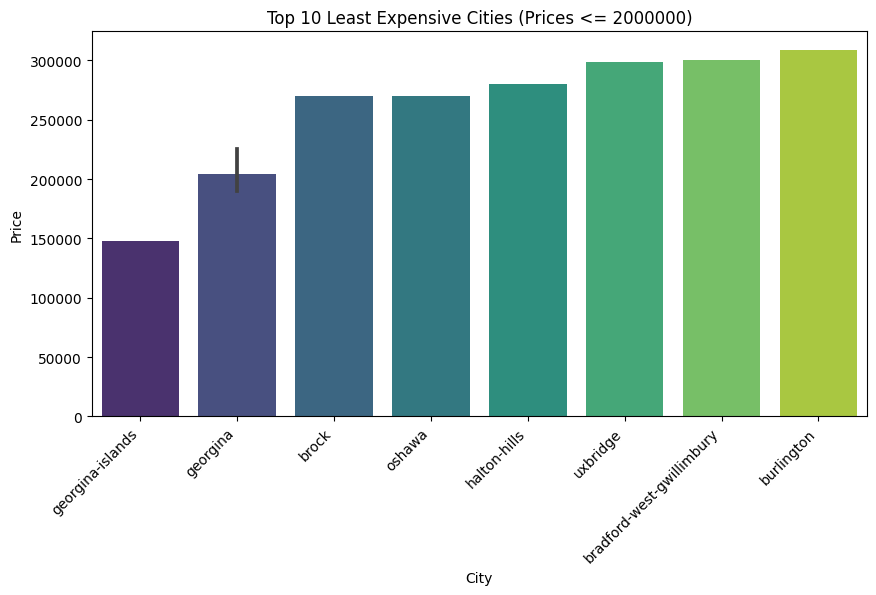

In [30]:
# TOP 10 LEAST EXPENSIVE CITIES (PRICES <= 10M)

# select columns from df
bar_data2 = clean_df1[['City', 'Price']]

# Exclude rows where Price is blank, <= 1, or > 2000000
bar_data2 = bar_data2[(bar_data2['Price'].notnull()) & (bar_data2['Price'] > 100000) & (bar_data2['Price'] <= 10000000)]

# Sort the DataFrame by Price in ascending order
sorted_bar_data2 = bar_data2.sort_values(by='Price')

# Create a bar chart for the least expensive cities
plt.figure(figsize=(10, 5))
sns.barplot(x='City', y='Price', data=sorted_bar_data2.head(10), palette='viridis')
plt.title('Top 10 Least Expensive Cities (Prices <= 2000000)')
plt.xlabel('City')
plt.ylabel('Price')
plt.xticks(rotation=45, ha='right')
plt.show()


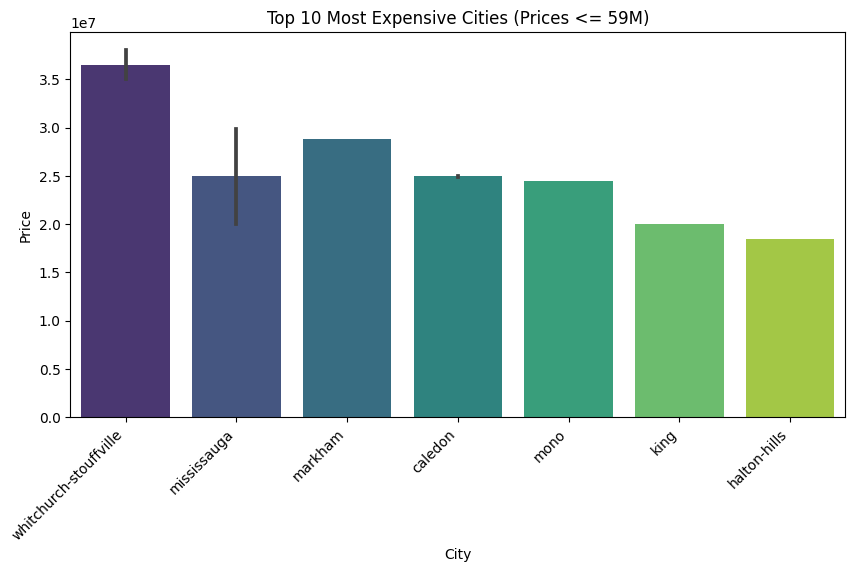

In [31]:
# TOP 10 MOST EXPENSIVE CITIES (PRICES <= 59M)

# select columns from df
bar_data3 = clean_df1[['City', 'Price']]

# Exclude rows where Price is blank, <= 1, or > 2000000
bar_data3 = bar_data3[(bar_data3['Price'].notnull()) & (bar_data3['Price'] > 1) & (bar_data3['Price'] <= 59000000)]

# Sort the DataFrame by Price in descending order
sorted_bar_data3 = bar_data3.sort_values(by='Price', ascending=False)

# Create a bar chart for the most expensive cities
plt.figure(figsize=(10, 5))
sns.barplot(x='City', y='Price', data=sorted_bar_data3.head(10), palette='viridis')
plt.title('Top 10 Most Expensive Cities (Prices <= 59M)')
plt.xlabel('City')
plt.ylabel('Price')
plt.xticks(rotation=45, ha='right')
plt.show()

In [32]:
# MAP SHOWING THE LOCATIONS OF THE TOP 10 LEAST EXPENSIVE HOUSES IN GTA

# Sselect data for mapping
least_expensive_houses = clean_df1[['City', 'Price', 'Latt', 'Longt']]

# Exclude rows where Price is blank or <= 1, and select the least expensive houses
least_expensive_houses = least_expensive_houses[(least_expensive_houses['Price'].notnull()) & (least_expensive_houses['Price'] > 1)]
least_expensive_houses = least_expensive_houses.sort_values(by='Price').head(10)  # Adjust to show top 10 least expensive houses

# Create a folium map centered at the first house in the DataFrame
m = folium.Map(location=[least_expensive_houses.iloc[0]['Latt'], least_expensive_houses.iloc[0]['Longt']], zoom_start=10)

# Use MarkerCluster for better visualization of multiple markers
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each house with the least expensive prices
for index, row in least_expensive_houses.iterrows():
    folium.Marker([row['Latt'], row['Longt']], popup=f"{row['City']} - ${row['Price']:,}", icon=None).add_to(marker_cluster)

# display map
m

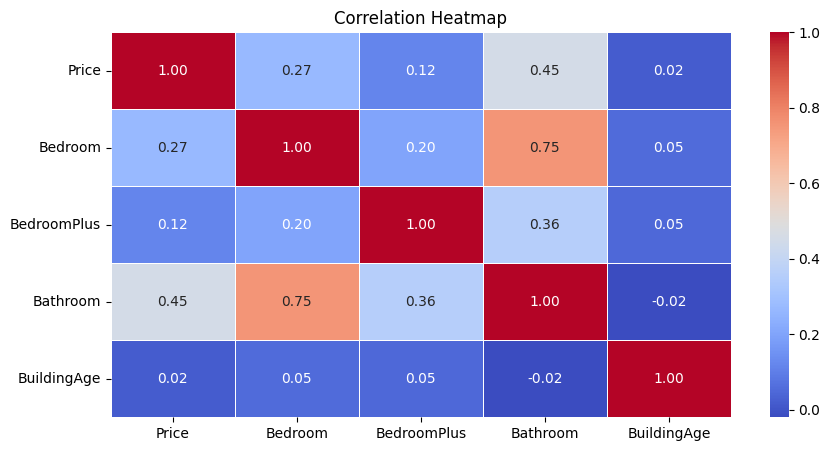

In [33]:
# CORRELATION HEATMAP FOR OTHER PRICE DETERMINANTS

# Select relevant columns
selected_columns = ['Price', 'Bedroom', 'BedroomPlus', 'Bathroom', 'BuildingAge']

# Create a correlation matrix
correlation_matrix = clean_df1[selected_columns].corr()

# Create a heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

C:\Users\myk70\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\myk70\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\myk70\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


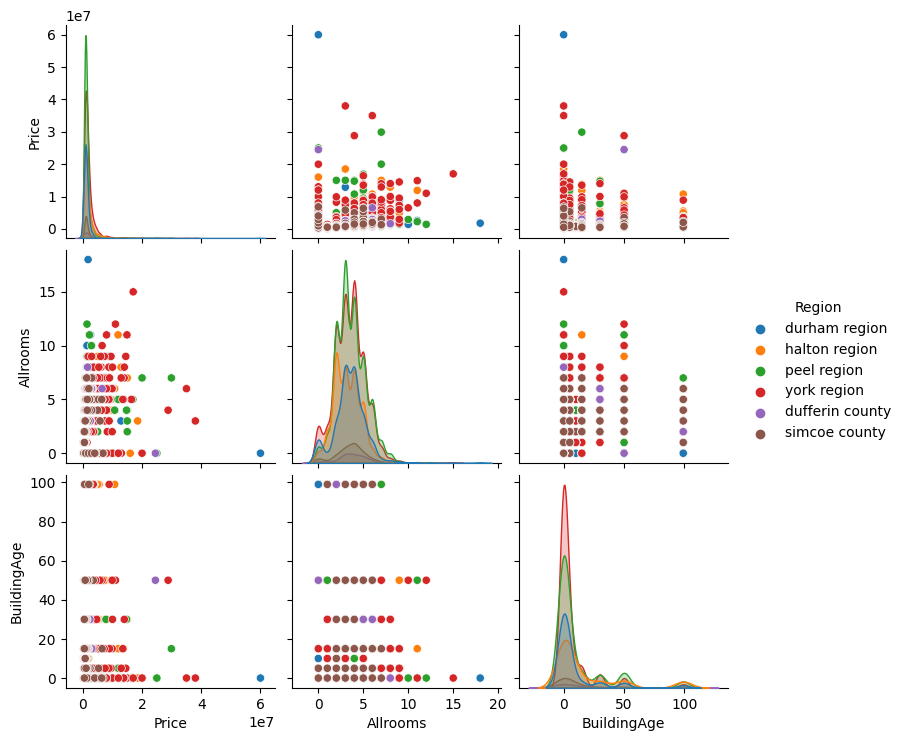

In [34]:
# VISUALIZE POTENTIAL CORRELATIONS AND DISTRIBUTIONS BETWEEN SELECTED COLUMNS

# Create a subset DataFrame with selected columns
target_df = clean_df1[['Price', 'Allrooms', 'BuildingAge', 'Region']]

# Create a pair plot with hue set to 'Region'
sns.pairplot(target_df, hue='Region')

In [35]:
# MAP SHOWING COVERED GEOGRAPHICAL REGION OF SCRAPPED DATA


# selected columns
map_data = clean_df1[['Region', 'City', 'Latt', 'Longt', 'Price']].set_index(['Region', 'City'])

# compute the average latittude and longitude
average_lat = map_data['Latt'].mean()
average_long = map_data['Longt'].mean()

# create a Folium map centered at the average location
m = folium.Map(location=[average_lat, average_long], zoom_start=9)

# instantiate a marker cluster object for the regions in the df
regionx = plugins.MarkerCluster().add_to(m)

# iterate through the rows of the DataFrame (map_data) and add markers to the map
for x in map_data.iterrows():
    folium.Marker([x[1].Latt, x[1].Longt],
                 popup = x[0]).add_to(regionx)

m

In [36]:
# MAP SHOWING COVERED GEOGRAPHICAL REGION OF SCRAPPED DATA


# selected columns
map_data = clean_df1[['Region', 'City', 'Latt', 'Longt', 'Price']].set_index(['Region', 'City'])

# compute the average latittude and longitude
average_lat = map_data['Latt'].mean()
average_long = map_data['Longt'].mean()

# create a Folium map centered at the average location
m = folium.Map(location=[average_lat, average_long], zoom_start=9)

# iterate through the rows of the DataFrame (map_data) and add markers to the map
for x in map_data.iterrows():
    folium.Marker([x[1].Latt, x[1].Longt],
                 popup = x[0]).add_to(m)

m

In [37]:


# MAP SHOWING THE COUNT FOR COVERED GEOGRAPHICAL REGION/CITIES

# selected columns
map_data = clean_df1[['Region', 'City', 'Latt', 'Longt', 'Price']]

# compute the average latitude and longitude
average_lat = map_data['Latt'].mean()
average_long = map_data['Longt'].mean()

# create a Folium map centered at the average location
m = folium.Map(location=[average_lat, average_long], zoom_start=9)

# create a dictionary to store the count of houses in each city
city_counts = {}

# iterate through the rows of the DataFrame (map_data) and add markers to the map
for _, row in map_data.iterrows():
    city = row['City']
    coordinates = [row['Latt'], row['Longt']]

    # update the count of houses in each city
    city_counts[city] = city_counts.get(city, 0) + 1

# iterate through the cities and add markers with counts
for city, count in city_counts.items():
    city_data = map_data[map_data['City'] == city]
    avg_lat = city_data['Latt'].mean()
    avg_long = city_data['Longt'].mean()
    folium.Marker(
        location=[avg_lat, avg_long],
        popup=f"{city}: {count} houses",
        icon=folium.Icon(color='blue')
    ).add_to(m)

# display the map
m



>> # PART 6:
> ### SUMMARY